In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wonders-of-world/wonders_of_world.csv
/kaggle/input/wonders-of-world/WondersOfWorld_23.csv
/kaggle/input/wonders-of-world/wonders_of_world rev3.csv


# <div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 0px; color:#FAF0EF; font-size:150%; text-align:center; padding:10px; background:#708D81; border-radius: 10px; box-shadow: 10px 10px 5px #FAF0EF;">🌟 Wonders of the World 🌍<br></div>

<div style="text-align:center; margin-top:20px;">
    <img src="https://github.com/KarnikaKapoor/Files/blob/main/WOWSN.gif?raw=true" alt="Wonders of the World" style="border-radius:10px; width:80%;"/>
</div>

## 🎉 Welcome Aboard!
Welcome to this exciting journey through time and space! We're about to embark on an exploration of the majestic Wonders of the World. This starter notebook is designed to provide a foundation for your data analysis and visualization adventures. Whether you're a history enthusiast, a budding data scientist, or just curious about the past, you're in the right place. Let's dive into the data and uncover the stories behind these architectural marvels! 🚀📚

🧩🚧 **This is a starter notebook, a canvas for your creativity.** Feel free to fork it, make it your own, and build upon it. Here, I'll provide a framework to kick-start your analysis. 🌟

## Dataset Columns: Data Overview 📊📉📈
Our dataset is a window into the past, encompassing a variety of details about the world's wonders. Here's a quick overview of the columns:

- **Name**: The name of each wonder.
- **Type**: The category, such as Ancient or Medieval.
- **Latitude & Longitude**: Geographical coordinates.
- **Location**: The physical location of the wonder.
- **Wikipedia Link**: A link to more information on Wikipedia.
- **Picture Link**: A URL to a picture of the wonder.
- **Build in Year**: The year when the wonder was constructed.
- **Image Base64**: Base64 encoded image data for visualization.

<div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 1px; color:#EFEAE4; font-size:150%; padding:10px; background:#E06B8D; border-radius: 10px; box-shadow: 10px 10px 5px #EFEAE4;">
    Table Of Contents<br>
</div>

- <a href="#1" style="text-decoration: none; color:#708D81; font-weight: bold;">1. IMPORTING LIBRARIES</a>
- <a href="#2" style="text-decoration: none; color:#A5C8B4; font-weight: bold;">2. LOADING DATA</a>
- <a href="#3" style="text-decoration: none; color:#D3E4CD; font-weight: bold;">3. DATA EXPLORATION</a>
- <a href="#4" style="text-decoration: none; color:#CCA483; font-weight: bold;">4. GEOGRAPHICAL ANALYSIS</a>
- <a href="#5" style="text-decoration: none; color:#967860; font-weight: bold;">5. HISTORICAL INSIGHTS</a>
- <a href="#6" style="text-decoration: none; color:#E06B8D; font-weight: bold;">6. FIN</a>

<a id="1"></a>
# <div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 1px; color:#FAF0EF; font-size:150%; text-align:left; padding:10px; background:#708D81; border-radius: 10px;">1. IMPORTING LIBRARIES</div>


In [2]:
# IMPORTING LIBRARIES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors
import geopandas as gpd
import folium
from folium import IFrame
import base64
from io import BytesIO
from PIL import Image
from shapely.geometry import Point
from datetime import datetime

# Updated palette with a contrasting pink
palette = ["#708D81", "#A5C8B4", "#D3E4CD", "#CCA483", "#967860", "#D7A9E3", "#E06B8D"]  

sns.set(rc={"axes.facecolor":"#EFEAE4", "figure.facecolor":"#EFEAE4"})
cmap = colors.ListedColormap(palette)

import warnings
warnings.filterwarnings("ignore")

<a id="2"></a>
# <div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 1px; color:#FAF0EF; font-size:150%; text-align:left; padding:10px; background:#A5C8B4; border-radius: 10px;">2. LOADING DATA</div>

## 🗺️ Unveiling the Mysteries
Imagine opening a treasure chest that's been hidden away for centuries, filled with ancient maps, mysterious blueprints, and captivating stories of grandeur. That's precisely what our dataset is like. It's a collection of awe-inspiring tales about some of the most famous structures around the globe. Let's unlock this chest and embark on a journey of discovery! 🗝️🌏

## 🔍 The First Glimpse
As we lift the lid off our digital treasure chest, let's carefully explore its contents. We're about to get a first-hand look at the data - a crucial step in setting the stage for our analysis. Think of yourself as a detective, piecing together stories from clues hidden in plain sight. Ready to unveil the secrets? Let's dive in! 🕵️‍♂️💼

In [3]:
# Load the dataset
file_path = '/kaggle/input/wonders-of-world/WondersOfWorld_23.csv'
data = pd.read_csv(file_path)
data.head()

,Name,Type,Latitude,Longitude,Location,Wikipedia link,Picture link,Build in year,Image Base64
0,Great Pyramid of Giza,Ancient,29.979167,31.134167,"Giza Necropolis, Egypt",http://en.wikipedia.org/wiki/Great_Pyramid_of_...,http://upload.wikimedia.org/wikipedia/commons/...,2560 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
1,Stonehenge,Medieval,51.178611,-1.826111,"Amesbury, United Kingdom",http://en.wikipedia.org/wiki/Stonehenge,https://th-thumbnailer.cdn-si-edu.com/g7SlMbJR...,2400 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
2,Lighthouse of Alexandria,Ancient,31.213889,29.885556,"Alexandria, Egypt",http://en.wikipedia.org/wiki/Lighthouse_of_Ale...,https://images.memphistours.com/large/78611778...,280 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
3,Hanging Gardens of Babylon,Ancient,33.535500,44.247500,Iraq,http://en.wikipedia.org/wiki/Hanging_Gardens_o...,http://upload.wikimedia.org/wikipedia/commons/...,600 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
4,Hagia Sophia,Medieval,41.008548,28.979938,"Istanbul, Turkey",http://en.wikipedia.org/wiki/Hagia_Sophia,http://upload.wikimedia.org/wikipedia/commons/...,537 AD,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...


In [4]:
# Summary of DataPoints
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            50 non-null     object 
 1   Type            50 non-null     object 
 2   Latitude        50 non-null     float64
 3   Longitude       50 non-null     float64
 4   Location        50 non-null     object 
 5   Wikipedia link  50 non-null     object 
 6   Picture link    50 non-null     object 
 7   Build in year   39 non-null     object 
 8   Image Base64    50 non-null     object 
dtypes: float64(2), object(7)
memory usage: 3.6+ KB
None


In [5]:
# Summary statistics
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Name,50,45,Great Pyramid of Giza,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,50,7,New7Wonders Foundation,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Latitude,50.0,NaN,NaN,NaN,30.357855,23.631071,-24.591944,26.06875,36.057778,40.943494,89.9999
Longitude,50.0,NaN,NaN,NaN,-8.164173,73.058891,-171.733333,-73.993681,2.61205,30.823864,147.7
Location,50,38,China,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wikipedia link,50,45,http://en.wikipedia.org/wiki/Great_Pyramid_of_...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Picture link,50,46,http://upload.wikimedia.org/wikipedia/commons/...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Build in year,39,33,2560 BC,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Image Base64,50,45,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**🧼 Tidying Up the Map**

Before we embark on our thrilling journey through the annals of history, let's ensure our map – the dataset – is pristine and ready for exploration. 🗺️🧹

Envision our dataset as an ancient map, filled with hidden clues and treasures waiting to be discovered. But, as with any old map, there are some wrinkles to smooth out and dust to clear:

- **Missing Pieces**: Just like a timeworn map might have torn edges or faded paths, our dataset has some missing values that need addressing. We'll fill in these gaps or navigate around them, ensuring no crucial information is lost in our exploration.

- **Mending Broken Links**: Over time, links to the past might become obscured or broken. We'll mend these links, ensuring every path leads to meaningful insights about these wonders.

- **Clarifying the Unclear**: Sometimes, smudges and stains can mask important details. We'll clean these up, clarifying any ambiguities, so each landmark on our map stands out vividly.

By carefully tidying up our map, we ensure that every 'X' marking a wonder is clear and every path we take leads to accurate and illuminating discoveries. Let's roll up our sleeves and prepare our dataset for this adventure, leaving no stone unturned in our quest for knowledge! 🌟🔍


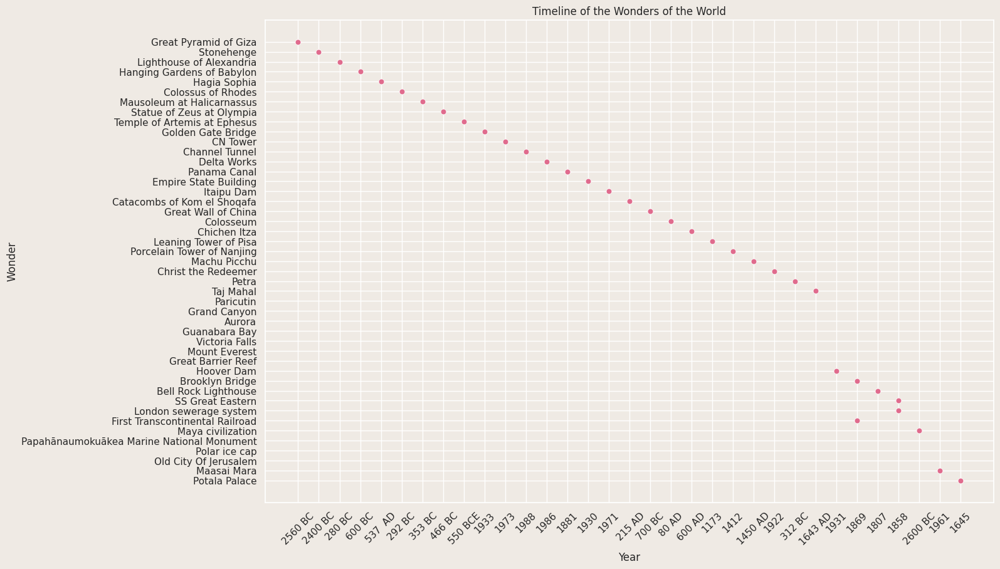

Build in year
2560 BC     2
1869        2
1881        2
700 BC      2
80 AD       2
1858        2
1807        1
1931        1
2600 BC     1
312 BC      1
1922        1
1450 AD     1
1412        1
1961        1
1173        1
600 AD      1
1643 AD     1
 215 AD     1
2400 BC     1
1971        1
1930        1
1986        1
1988        1
1973        1
1933        1
 550 BCE    1
 466 BC     1
 353 BC     1
292 BC      1
537  AD     1
600 BC      1
280 BC      1
1645        1
Name: count, dtype: int64


In [6]:

# Plotting
plt.figure(figsize=(15, 10))
sns.scatterplot(x='Build in year', y='Name', data=data, color= palette[-1], s=40)
plt.title('Timeline of the Wonders of the World')
plt.xlabel('Year')
plt.ylabel('Wonder')
plt.xticks(rotation=45)
plt.show()


print(data["Build in year"].value_counts())

## 📜 Weaving Through the Ages: A Historical Tapestry

Our visual exploration brings to life the timeline of the Wonders of the World. Spanning from the dawn of civilization to the modern day, each point on this timeline represents an epochal achievement of human ingenuity. Let's delve into the epochs that these wonders illuminate:

- **Echoes of Antiquity**: Witness the ancient marvels such as the Great Pyramid of Giza, constructed circa 2560 BC. These structures stand as testaments to the grand ambitions of civilizations long past.
- **Medieval Mastery**: Fast forward to the medieval times where wonders like the Leaning Tower of Pisa (1173 AD) showcase the era's architectural prowess and the flowering of Renaissance thought.
- **Industrial Revolution and Beyond**: The 19th and 20th centuries mark an era of rapid innovation, with iconic structures like the Eiffel Tower (1889) and the Statue of Liberty (1886) symbolizing the industrial age's transformative power.

This chronology is more than mere dates; it's a narrative of humanity's unyielding drive to create and to leave a mark on the Earth that endures through the ages. As we prepare to rectify the timeline's dates, we appreciate the storied legacy these wonders carry—a legacy of aspiration, artistry, and the unquenchable human spirit.


In [7]:
# Function to fix the measurement of timeline. 
def convert_year(year_str):
    try:
        year_str = year_str.strip()
        if 'BCE' in year_str or 'BC' in year_str:
            year = -int(year_str.replace('BCE', '').replace('BC', ''))
        elif 'AD' in year_str:
            year = int(year_str.replace('AD', ''))
        else:
            year = int(year_str)
    except ValueError:
        # Return NaN for missing values
        year = float('nan')
    return year

# Implementing the function
data['year'] = data['Build in year'].apply(lambda x: convert_year(str(x)))



## 🔧 Calibrating the Clock of History

As we've navigated the annals of time, we've encountered an array of dates, some basked in the light of the sun (AD) and others shrouded in the moon's shadow (BC/BCE). To thread these disparate moments into a single, cohesive chronology, we will now meticulously calibrate our dataset. This process will ensure that our analysis respects the unbroken continuum of history, where time's passage is indifferent to the constructs of our calendars. Let's proceed to synchronize our historical compass, enabling us to chart the epochs with exactitude.

<a id="3"></a>
# <div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 1px; color:#FAF0EF; font-size:150%; text-align:left; padding:10px; background:#D3E4CD; border-radius: 10px;">3. DATA EXPLORATION</div>

## 🎨 Painting a Picture with Data

In the realm of data, visualizations are akin to an artist's strokes on a canvas, bringing to life the hidden patterns and stories within numbers. Let's harness the power of visual tools, from charts to maps, to craft a narrative that captures the essence and impact of these historical marvels. Our visual storytelling will make the past accessible and unforgettable.

**📈 Exploring the Unknown**

With our historical map in hand and our data precisely tuned, we now embark on a voyage of discovery. Together, we'll uncover patterns and unearth fascinating facts. Which are the oldest wonders, and where do they stand? Does a pattern emerge in the types of wonders across different eras? Join us in this quest for knowledge, as every data point is a landmark on our journey through time. 🕵️‍♀️🌍

📊📉 **The Power of Visual Storytelling**

Visualizations not only reveal patterns—they tell stories, convey emotions, and bring abstract data to life. As we visualize the various facets of these wonders, prepare to be transported across time and space, connecting dots that weave together the grand tapestry of human achievement. Let's illuminate the narratives that lie within our data. ✨


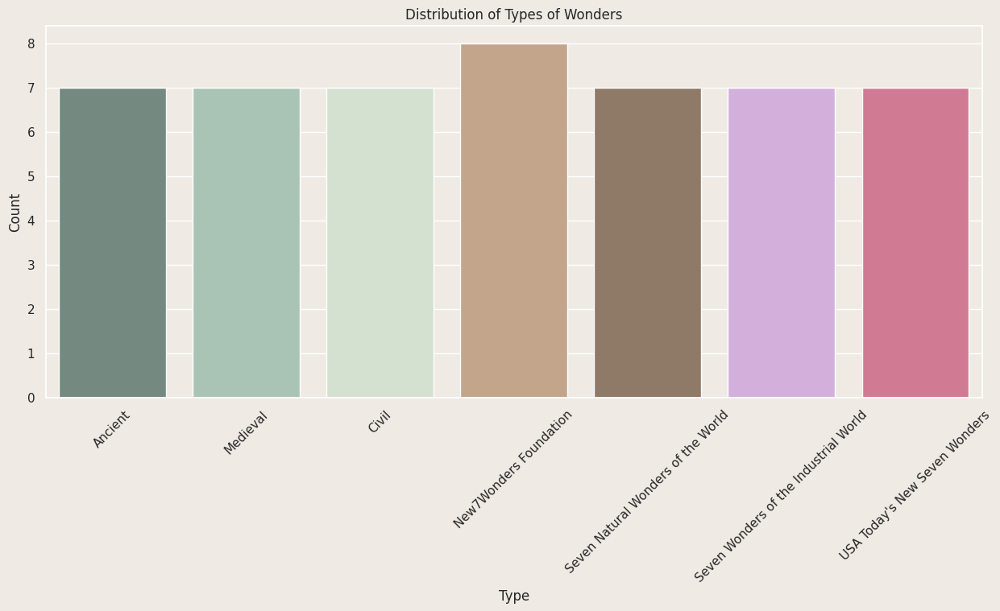

In [8]:

# Type Distribution
plt.figure(figsize=(15, 6))
sns.countplot(data=data, x='Type',palette= palette )
plt.title('Distribution of Types of Wonders')
plt.xlabel('Type')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.show()

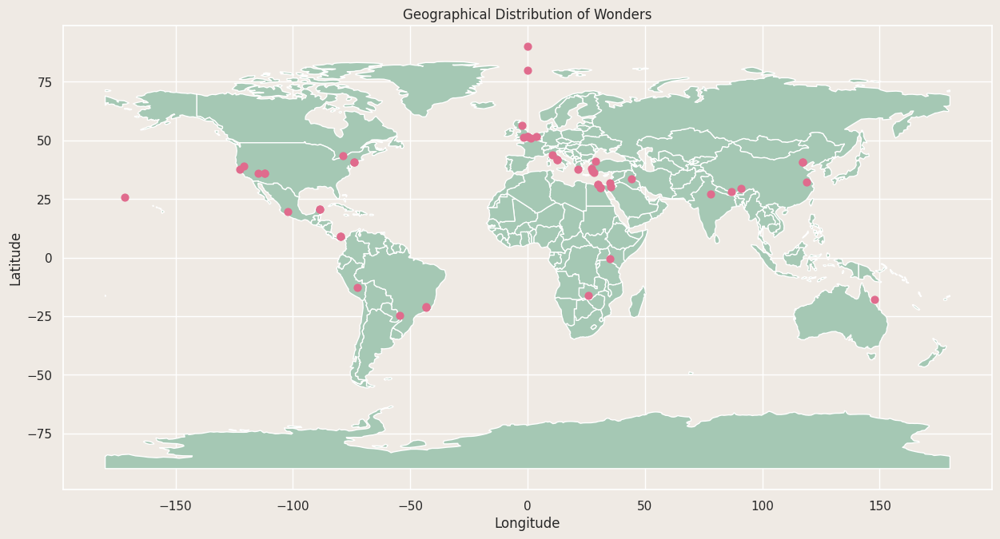

In [9]:
# Geographical Distribution
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.Longitude, data.Latitude))
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color=palette[1])
gdf.plot(ax=ax, color=palette[-1], marker='o', markersize=40)
plt.title('Geographical Distribution of Wonders')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

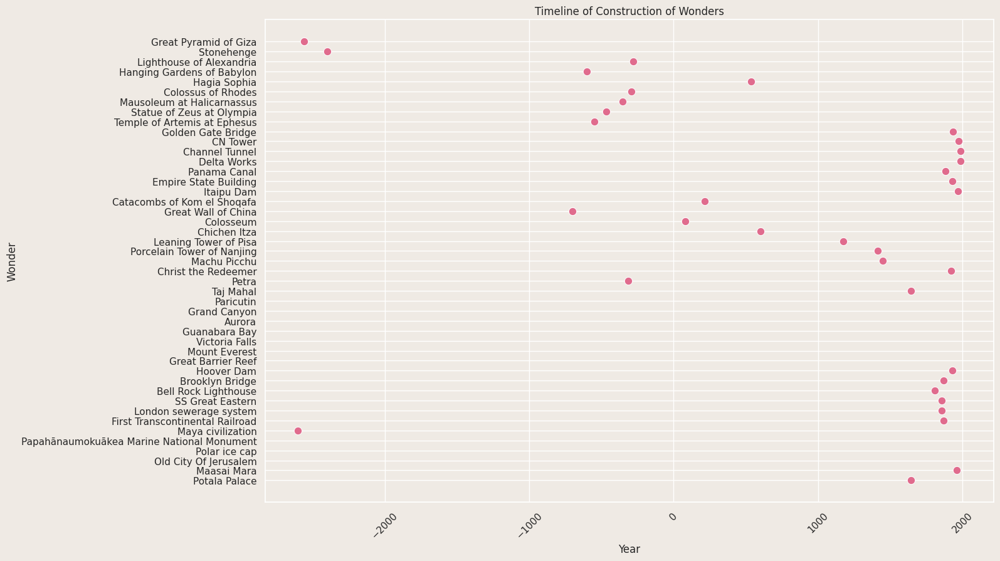

In [10]:
# Timeline of Construction
plt.figure(figsize=(15, 10))
sns.scatterplot(data=data, x='year', y='Name', color = palette[-1], s=80)
plt.title('Timeline of Construction of Wonders')
plt.xlabel('Year')
plt.ylabel('Wonder')
plt.xticks(rotation=45)

plt.show()

## 🎨 The Story So Far: Insights from Visual Exploration

Our journey through charts and maps has offered a panoramic view of the world's wonders, spanning from the dawns of history to contemporary marvels.

- The **Bar Chart** showcases the endurance of ancient and civil wonders, hinting at a legacy of architectural mastery that has stood the test of time.
- The **World Map** lays out the global tapestry, a testament to the universal human desire to create monuments that are as diverse as the cultures themselves.
- The **Timeline** narrates the saga of human ambition, where each dot marks a confluence of history, culture, and technological achievement through the ages.

These visual stories form the bedrock of our exploration, raising questions about the evolution of these wonders through time. They prompt us to ponder the forces that spurred their creation and how they may shape the wonders yet to come.

With a wealth of visual insights now at our fingertips, we pivot to the geographical aspect of our analysis. Join us as we map the coordinates of history and uncover the geographical influences that have shaped the legacy of these wonders.

<a id="4"></a>
# <div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 1px; color:#FAF0EF; font-size:150%; text-align:left; padding:10px; background:#CCA483; border-radius: 10px;">4. GEOGRAPHICAL ANALYSIS</div>

🗺 🌎 As we embark on a geographical dissection, we aim to uncover the layers of cultural and historical significance etched into the landscapes that cradle these marvels. Let's delve into a spatial analysis to understand how geography has sculpted the narrative of human achievement.


In [11]:

# Function to convert base64 to image and resize
def base64_to_image(base64_string, size=(300, 200)):
    img_data = base64.b64decode(base64_string)
    image = Image.open(BytesIO(img_data))
    image = image.resize(size, Image.ANTIALIAS)
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode()

# Calculate mean latitude and longitude
mean_latitude = data['Latitude'].mean()
mean_longitude = data['Longitude'].mean()

# ESRI World Terrain tiles URL and map creation
esri_world_terrain_tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Terrain_Base/MapServer/tile/{z}/{y}/{x}'
map = folium.Map(location=[mean_latitude, mean_longitude], tiles=esri_world_terrain_tiles, attr='ESRI World Terrain', zoom_start=2, min_zoom=2, max_zoom=2, zoom_control=False)

for idx, row in data.iterrows():
    image = base64_to_image(row['Image Base64'])
    
    # HTML content for the popup with CSS styling
    html = f"""
    <style>
        .popup-title {{color:purple;font-size: 16px;font-weight: bold; margin-bottom: 5px; background-color:D3E4CD ;padding: 3px;border-radius: 3px;
        }}
        .popup-frame {{border: 2px solid purple;border-radius: 5px;padding: 5px; background-color: purple;
        }}
    </style>
    <div class="popup-frame">
        <div class="popup-title">{row['Name']}</div> 
        <img src="data:image/png;base64,{image}" style="width:100%;">
    </div>
    """
    iframe = IFrame(html, width=320, height=240) 
    popup = folium.Popup(iframe, max_width=300)
    folium.Marker([row['Latitude'], row['Longitude']], popup=popup, icon=folium.Icon(color='purple' )).add_to(map)

# Display
map


## 🔍 Interactive Exploration: Each Wonder at a Click

Our map now comes to life with interactive icons — a simple click reveals the name and a glimpse of each wonder. This feature brings history into the present, allowing a direct and personal connection with these timeless monuments.

- **Discover**: Click to unveil the visual and historical essence of each site.
- **Connect**: Each image invites you to step into the story it holds.

As this section concludes, take a moment to appreciate the blend of geography and history, and how each wonder has its unique place in the world's cultural panorama. Your journey through the wonders continues, enriched by every click, every discovery.



<a id="5"></a>
# <div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 1px; color:#FAF0EF; font-size:150%; text-align:left; padding:10px; background:#967860; border-radius: 10px;">5. HISTORICAL INSIGHTS</div>

In this chapter of our exploration, we turn to the timelines, the very scaffolds of history, to understand when and why these wonders were erected. This isn't just about dates; it's about the epochs they symbolize and the historical currents they reveal.

**📜 Unraveling Time's Tapestry**

Let us now sift through the sands of time, tracing the lineages of awe-inspiring structures that dot our collective memory. We aim to connect the dots between dates, drawing insights from the silent stones that have witnessed the march of millennia. What stories do they tell? What secrets do they keep? With data as our guide, we seek to reveal the enduring legacies carved by humanity across the canvas of time. ⌛🔍


In [12]:
#Calculating Age 
current_year = datetime.now().year
data['Age'] = data['year'].apply(lambda x: (current_year - x) if x > 0 else (current_year + abs(x) - 1))


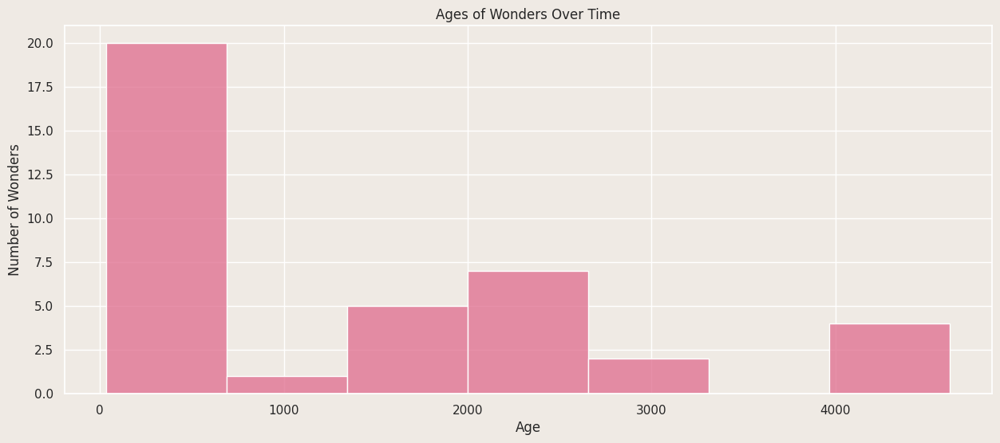

In [13]:
# visualizing ages
plt.figure(figsize=(15, 6))
sns.histplot(data['Age'], kde=False,color = palette[-1],)
plt.title('Ages of Wonders Over Time')
plt.xlabel('Age')
plt.ylabel('Number of Wonders')
plt.show()

## 🕰️ Visualizing the Ages of Wonders

The histogram above illustrates the distribution of the ages of wonders, offering a tangible sense of their place in history. As we can see:

- A significant number of wonders were constructed more than two millennia ago, highlighting the early civilizations' remarkable ambition and skill.
- There is also a notable number of wonders built in more recent centuries, reflecting a resurgence in monumental architecture as a symbol of cultural and national pride.

This age distribution underscores the timeless human drive to leave a mark on the earth through monumental works. As we continue to explore, we carry with us a deeper appreciation for the historical context that these wonders provide.


In [14]:

type_counts = data['Type'].value_counts()
type_counts_df = pd.DataFrame(type_counts).reset_index()
type_counts_df.columns = ['Type', 'Count',]
average_age_by_type = data.groupby('Type')['Age'].mean().reset_index()
type_counts_df = type_counts_df.merge(average_age_by_type, on='Type', how='left')
type_counts_df.rename(columns={'Age': 'Average Age'}, inplace=True)

styled_df = type_counts_df.style.background_gradient(cmap=cmap) \
                             .set_properties(**{
                                 'border': '4px solid #708D81',
                                 'background-color': '#EFEAE4',
                                 'color': '#E06B8D'
                             })
styled_df

,Type,Count,Average Age
0,New7Wonders Foundation,8,1757.250000
1,Ancient,7,2750.714286
2,Medieval,7,1977.428571
3,Civil,7,71.285714
4,Seven Natural Wonders of the World,7,nan
5,Seven Wonders of the Industrial World,7,155.428571
6,USA Today's New Seven Wonders,7,1687.333333


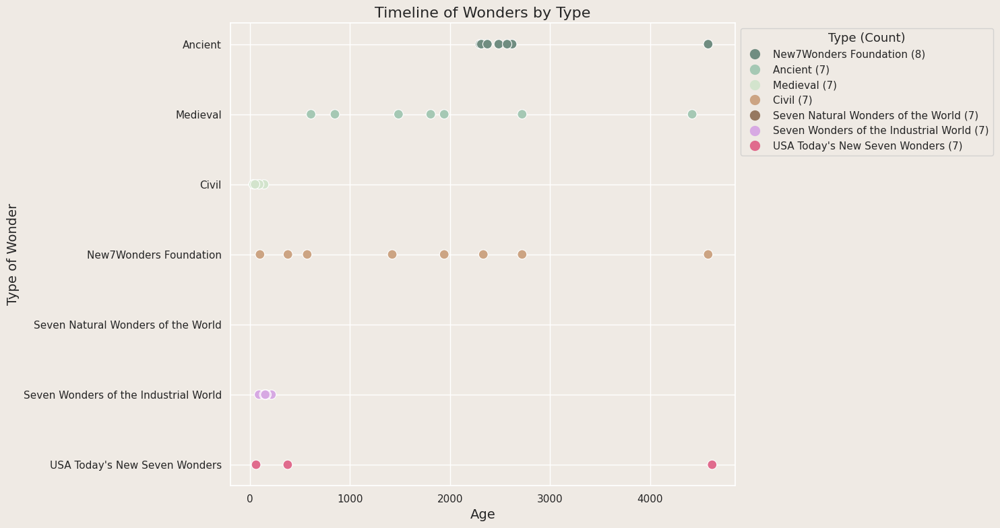

In [15]:
plt.figure(figsize=(15, 8))
scatter = sns.scatterplot(
    x='Age', 
    y='Type', 
    hue='Type', 
    data=data, 
    palette=palette, 
    s=100 
)

legend_handles = [plt.Line2D(
    [0], [0], 
    marker='o', 
    color=color, 
    label=f'{type_} ({count})', 
    markersize=10,  
    linestyle=''
) for type_, color, count in zip(type_counts.index, palette, type_counts.values)]


plt.legend(
    handles=legend_handles, 
    title='Type (Count)', 
    title_fontsize='13', 
    fontsize='11',  
    loc='upper left', 
    bbox_to_anchor=(1, 1)
)

plt.title('Timeline of Wonders by Type', fontsize=16)  
plt.xlabel('Age', fontsize=14)  
plt.ylabel('Type of Wonder', fontsize=14)   
plt.grid(True)  
plt.tight_layout()   
plt.show()


## 🎓 CONCLUSION

As we draw the curtains on this analytical saga, our visual and data-driven journey has unveiled the age and distribution of wonders that stretch across human history and geography. The insights we've gathered pave the way for deeper investigations and new discoveries.

**🌟 Wrapping Up Our Grand Tour**

- Our **data visualizations** painted a vivid portrait of the ages and types of wonders, revealing patterns of human achievement across time and space.
- The **geographical analysis** showed us not just where these wonders stand, but also the cultural diversity they represent.
- Lastly, the **historical timeline** placed each wonder in the context of human history, providing a dynamic view of our past.

This notebook serves as an initial map for your explorations into the wonders of our world. As a starter resource, it's designed for you to expand upon, explore new datasets, add richer layers of analysis, and even correct course as new information comes to light.

<div style="text-align: center; margin-top: 20px;">
    <img src="https://github.com/KarnikaKapoor/Files/blob/main/WOWSN2.gif?raw=true" alt="Journey's End" style="width: 50%; border-radius: 10px;"/>
</div>

As you continue on from here, may your curiosity be as boundless as the wonders you seek to understand. Embark on your next voyage with the knowledge that every end is just the beginning of another adventure.

<div style="text-align:center; color:#E06B8D; font-size:120%; margin-top: 25px; font-family: 'Playfair Display', serif;">
    <strong>Thank you for exploring with us. If you liked this nodebook, check out the data card as well. Until next time, keep discovering!</strong>
</div>

<a id="6"></a>
# <div style="font-family: 'Playfair Display', serif; font-weight:bold; letter-spacing: 1px; color:#FAF0EF; font-size:150%; text-align:left; padding:10px; background:#E06B8D; border-radius: 10px;">6. FIN</div>
